<div class="alert alert-danger" role="alert">
<h1 align="center"><font size = 14>Logistic-Regularization</font></h1>
<h4 align="center">September 18-2024<h4>
<h3 align="center">Armin Amani</h3>

<div class="alert alert-danger" role="alert">
📤 Import Libraries

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

<div class="alert alert-danger" role="alert"> 
💾 Read CSV file

In [4]:
df = pd.read_csv('Breast_Cancer.csv')
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [5]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    int64  
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [7]:
df = df.drop(['Unnamed: 32','id'],axis=1)
df

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    int64  
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

<div class="alert alert-danger" role="alert"> 
🔎 Data Visualize

In [9]:
df.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [10]:
df['diagnosis'].value_counts()

diagnosis
0    357
1    212
Name: count, dtype: int64

c:\Users\Beethoven\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Beethoven\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Beethoven\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='diagnosis', ylabel='count'>

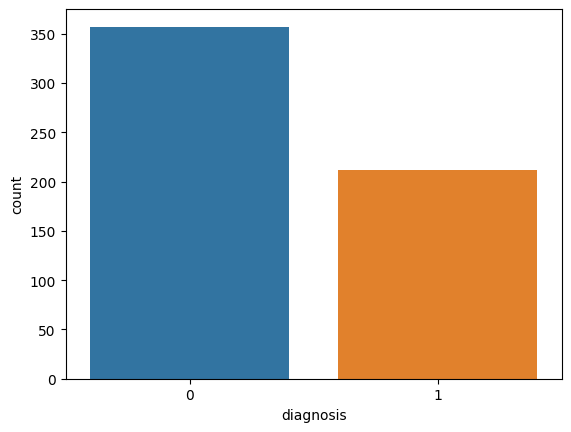

In [11]:
sns.countplot(data=df,x='diagnosis')

In [12]:
sns.pairplot(data=df,diag_kind='kde')

c:\Users\Beethoven\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Beethoven\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Beethoven\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Beethoven\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categoric

<Axes: >

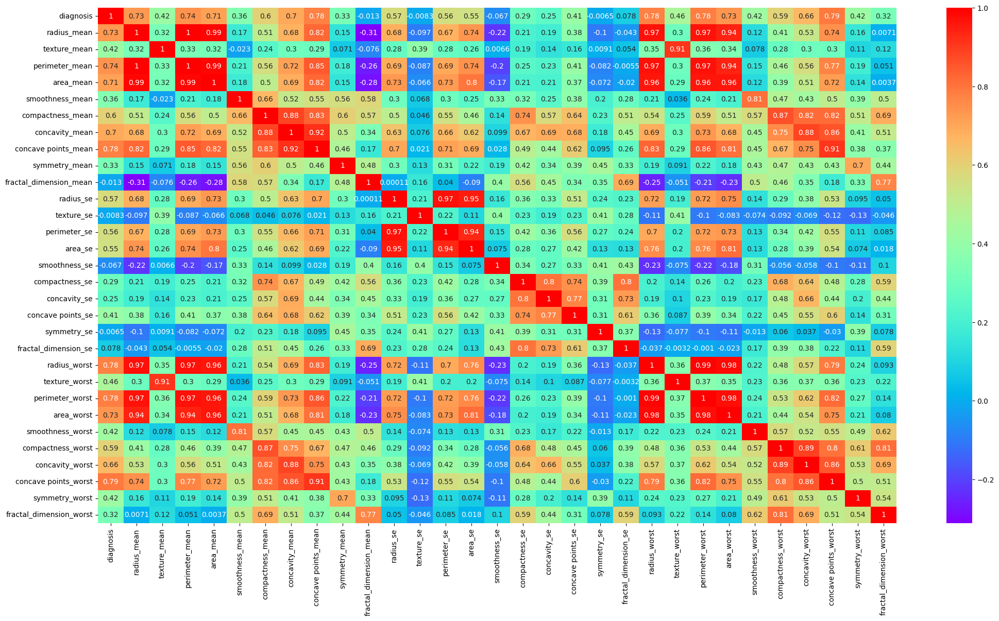

In [13]:
plt.figure(figsize=(25,13))
sns.heatmap(df.corr(),annot=True,cmap=plt.cm.rainbow,cbar=True)

In [14]:
df.corr()[['diagnosis']].sort_values(by='diagnosis',ascending=True).T

,smoothness_se,fractal_dimension_mean,texture_se,symmetry_se,fractal_dimension_se,concavity_se,compactness_se,fractal_dimension_worst,symmetry_mean,smoothness_mean,...,concavity_mean,area_mean,radius_mean,area_worst,perimeter_mean,radius_worst,concave points_mean,perimeter_worst,concave points_worst,diagnosis
diagnosis,-0.067016,-0.012838,-0.008303,-0.006522,0.077972,0.25373,0.292999,0.323872,0.330499,0.35856,...,0.69636,0.708984,0.730029,0.733825,0.742636,0.776454,0.776614,0.782914,0.793566,1.0


c:\Users\Beethoven\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Beethoven\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='smoothness_se', ylabel='diagnosis'>

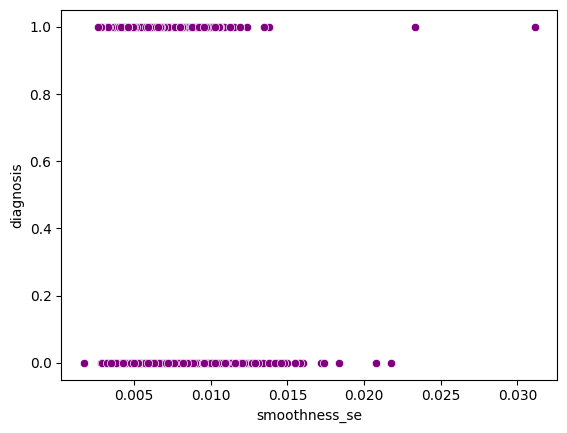

In [15]:
sns.scatterplot(data=df,x='smoothness_se',y='diagnosis',color='purple')

<div class="alert alert-danger" role="alert"> 
🔎 Seperate X & Y

In [16]:
X = df.drop('diagnosis',axis=1)
X

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [17]:
Y = df['diagnosis']
Y

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64

<div class="alert alert-danger" role="alert"> 
🔎 train and test split

In [18]:
x_train , x_test , y_train , y_test = train_test_split(X,Y,test_size=0.3,random_state=101)

<div class="alert alert-danger" role="alert"> 
🔎 Scalling Data

In [19]:
scaler = StandardScaler()
scaler

StandardScaler()

In [20]:
scaler.fit(x_train,y_train)

StandardScaler()

In [21]:
x_train_s = scaler.transform(x_train)
x_test_s = scaler.transform(x_test)

<div class="alert alert-danger" role="alert"> 
🔎 Creat the model

In [22]:
model = LogisticRegression()
model

LogisticRegression()

In [23]:
model.fit(x_train_s,y_train)

LogisticRegression()

In [24]:
coefficient = model.coef_
coefficient

array([[ 0.49497163,  0.23501913,  0.44863542,  0.49781489, -0.03973334,
        -0.30709314,  0.70472306,  0.90423871,  0.31447805, -0.48508873,
         0.82344804, -0.2786648 ,  0.317364  ,  0.73040569,  0.05960469,
        -0.59158081, -0.00862051,  0.00800307, -0.05239891, -0.66159428,
         1.0914887 ,  1.44266415,  0.80883559,  0.94917078,  0.92433461,
        -0.01790473,  0.65863866,  0.99092263,  0.59543633,  0.40438504]])

<div class="alert alert-danger" role="alert"> 
🔎 Prediction

In [25]:
y_predict = model.predict(x_test_s)
y_predict

array([0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], dtype=int64)

In [26]:
y_test

107    0
437    0
195    0
141    1
319    0
      ..
420    0
279    0
390    0
91     1
297    1
Name: diagnosis, Length: 171, dtype: int64

In [27]:
y_test.value_counts()

diagnosis
0    105
1     66
Name: count, dtype: int64

In [28]:
y_predict_df = pd.DataFrame(y_predict)
y_predict_df.value_counts()

0    107
1     64
Name: count, dtype: int64

<div class="alert alert-danger" role="alert"> 
🔎 Evaluating model

In [29]:
accuracy_score(y_test,y_predict)

0.9766081871345029

In [30]:
confusion_matrix(y_test,y_predict)

array([[104,   1],
       [  3,  63]], dtype=int64)

In [31]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       105
           1       0.98      0.95      0.97        66

    accuracy                           0.98       171
   macro avg       0.98      0.97      0.98       171
weighted avg       0.98      0.98      0.98       171



<div class="alert alert-danger" role="alert"> 
🔎 Loss function

In [32]:
from sklearn import metrics

In [33]:
MAE=  metrics.mean_absolute_error(y_test,y_predict)
MAE

0.023391812865497075

In [34]:
MSE = metrics.mean_squared_error(y_test,y_predict)
MSE

0.023391812865497075

In [35]:
RMSE = np.sqrt(MSE)
RMSE

0.1529438225803745

<div class="alert alert-danger" role="alert"> 
🔎 Sketch Loss Function (Regularization)

In [36]:
def Sigmoid(h_theta):
    return 1/(1+(np.exp(-h_theta)))

In [37]:
def loss_func(x,y,theta,theta0,landa):
    m = x.shape[0]
    loss = 0.0
    for i in  range(m):
        h_theta = np.dot(x.iloc[i,:],theta)+theta0
        g_h = Sigmoid(h_theta)
        loss += -y.iloc[i]*np.log(g_h)-(1-y.iloc[i])*np.log(1-g_h) + ((landa/2)*(np.sum(theta**2)))
    loss = loss/m
    return loss

In [38]:
x_train_s_df = pd.DataFrame(x_train_s)
x_train_s_df[1]

0      0.661742
1     -1.221863
2      0.517728
3     -0.058326
4      0.003394
         ...   
393    2.309897
394    0.675458
395    0.074258
396    0.481154
397   -0.147477
Name: 1, Length: 398, dtype: float64

In [39]:
theta = np.ones((x_train_s_df.shape[1],))
theta0 = 1.0
loss_func(x_train_s_df,y_train,theta,theta0,landa=0.01)

C:\Users\Beethoven\AppData\Local\Temp\ipykernel_128\1841045653.py:7: RuntimeWarning: divide by zero encountered in log
  loss += -y.iloc[i]*np.log(g_h)-(1-y.iloc[i])*np.log(1-g_h) + ((landa/2)*(np.sum(theta**2)))
C:\Users\Beethoven\AppData\Local\Temp\ipykernel_128\1841045653.py:7: RuntimeWarning: invalid value encountered in scalar multiply
  loss += -y.iloc[i]*np.log(g_h)-(1-y.iloc[i])*np.log(1-g_h) + ((landa/2)*(np.sum(theta**2)))


nan

<div class="alert alert-danger" role="alert"> 
🔎 GD

In [40]:
def gradient(x,y,theta,theta0,landa):
    m = x.shape[0]
    n = x.shape[1]
    dj_dtheta = np.zeros((n,))
    dj_dtheta0 = 0.0
    for i in range(m):
        h_theta = np.dot(x.iloc[i, :],theta)+theta0
        error = h_theta - y.iloc[i]
        for j in range(n):
            dj_dtheta[j] += error * x.iloc[i,j]
        dj_dtheta0 += error
    dj_dtheta = dj_dtheta/m + landa*theta
    dj_dtheta0 = dj_dtheta0/m
    return dj_dtheta,dj_dtheta0

In [41]:
theta = np.ones((x_train_s_df.shape[1],))
theta0 = 1.0
gradient(x_train_s_df,y_train,theta,theta0,landa=1e-8)

(array([12.34259508,  7.04542798, 13.0400811 , 12.66998995, 10.82568176,
        16.6054145 , 17.24162313, 16.67457049, 10.9585317 ,  6.65757092,
        13.78871978,  3.41777415, 14.30487931, 12.90863889,  3.82793764,
        13.19690843, 11.43177893, 13.815639  ,  5.6084738 ,  8.74793288,
        12.98857986,  7.29427408, 13.70895912, 12.88910923,  9.89163361,
        14.43312073, 15.32982654, 16.03141826,  9.55507508,  9.87627725]),
 0.6331658291457299)

In [42]:
def gradient_des(x,y,alpha,iters,theta,theta0,landa):
    j_history = []
    for i in range(iters):
        dj_dtheta,dj_dtheta0 = gradient(x,y,theta,theta0,landa)

        theta = theta - alpha * dj_dtheta
        theta0 = theta0 - alpha * dj_dtheta0

        loss = loss_func(x,y,theta,theta0,landa)
        j_history.append(loss)
        print(f"iteration:{i} ===> j(theta0,theta):{j_history[i]}")
    return theta,theta0,j_history

In [53]:
theta,theta0,j_history = gradient_des(x_train_s_df,y_train,alpha=0.1,iters=1000,theta=np.ones((x_train_s_df.shape[1],)),theta0=1,landa=1e-5)

iteration:0 ===> j(theta0,theta):4.949229677019492
iteration:1 ===> j(theta0,theta):0.5243518965298897
iteration:2 ===> j(theta0,theta):1.0910753574487855
iteration:3 ===> j(theta0,theta):0.707081111812185
iteration:4 ===> j(theta0,theta):0.7639786262103463
iteration:5 ===> j(theta0,theta):0.7059581551124681
iteration:6 ===> j(theta0,theta):0.6989103128440776
iteration:7 ===> j(theta0,theta):0.6818589844742183
iteration:8 ===> j(theta0,theta):0.6727410870563592
iteration:9 ===> j(theta0,theta):0.6640838441620833
iteration:10 ===> j(theta0,theta):0.657474594459045
iteration:11 ===> j(theta0,theta):0.6517801130569691
iteration:12 ===> j(theta0,theta):0.6469796558176775
iteration:13 ===> j(theta0,theta):0.6428059193745173
iteration:14 ===> j(theta0,theta):0.6391570275561239
iteration:15 ===> j(theta0,theta):0.6359299405480341
iteration:16 ===> j(theta0,theta):0.633058467338569
iteration:17 ===> j(theta0,theta):0.6304888266232581
iteration:18 ===> j(theta0,theta):0.6281802372895297
iterati

In [54]:
j_history

[4.949229677019492,
 0.5243518965298897,
 1.0910753574487855,
 0.707081111812185,
 0.7639786262103463,
 0.7059581551124681,
 0.6989103128440776,
 0.6818589844742183,
 0.6727410870563592,
 0.6640838441620833,
 0.657474594459045,
 0.6517801130569691,
 0.6469796558176775,
 0.6428059193745173,
 0.6391570275561239,
 0.6359299405480341,
 0.633058467338569,
 0.6304888266232581,
 0.6281802372895297,
 0.6260996667384358,
 0.6242202135896087,
 0.6225193563739774,
 0.6209779648928553,
 0.6195795317721614,
 0.6183096498767092,
 0.6171556237049668,
 0.6161061840265473,
 0.6151512704307385,
 0.6142818629526461,
 0.6134898482889432,
 0.6127679112550353,
 0.6121094448359121,
 0.6115084742657617,
 0.6109595919021359,
 0.6104579006001565,
 0.6099989639288855,
 0.6095787620158885,
 0.609193652114038,
 0.6088403332010579,
 0.6085158140753543,
 0.6082173845211422,
 0.6079425891951953,
 0.6076892039458532,
 0.6074552143186474,
 0.6072387960363832,
 0.6070382972677124,
 0.6068522225193115,
 0.606679218004091

In [56]:
x_test_s_df = pd.DataFrame(x_test_s)
x_test_s_df[1]

0     -0.179480
1     -0.764678
2     -0.684670
3     -0.291490
4     -0.531513
         ...   
166   -0.065183
167   -0.947552
168   -1.624187
169    0.785182
170   -0.270917
Name: 1, Length: 171, dtype: float64

In [57]:
loss = loss_func(x_test_s_df,y_test,theta,theta0,landa=1e-5)

In [58]:
loss

0.6087690341565088